In [27]:
from sklearn.feature_extraction.text import CountVectorizer
import os
from scipy.sparse import csr_matrix
import re
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import pydotplus
from IPython.display import Image
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
import seaborn as sns
import matplotlib.pyplot as plt


In [11]:
# directory = "Edgar Allan Poe"


# os.mkdir(path)

In [2]:
parent_dir = "E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets"
# Use the os module to get a list of subfolders in the folder
poets = [folder for folder in os.listdir(parent_dir) if os.path.isdir(os.path.join(parent_dir, folder))]

# Print the list of folder names
print(poets)

['Alexander Pope', 'Alfred Lord Tennyson', 'Alice Walker', 'Allen Ginsberg', 'Anne Bradstreet', 'Anne Sexton', 'Anonymous', 'Banjo Paterson', 'Benjamin Zephaniah', 'Billy Collins', 'Carl Sandburg', 'Charles Bukowski', 'Charles Dickens', 'Christina Georgina Rossetti', 'Claude McKay', 'Countee Cullen', 'Derek Walcott', 'Donald Bruce Dawe', 'Dorothy Parker', 'Dylan Thomas', 'Edgar Albert Guest', 'Edgar Allan Poe', 'Edna St. Vincent Millay', 'Elizabeth Barrett Browning', 'Elizabeth Bishop', 'EmilyDickinson', 'Ezra Pound', 'Federico García Lorca', 'Gwen Harwood', 'Gwendolyn Brooks', 'Henry Lawson', 'Henry Wadsworth Longfellow', 'Hilaire Belloc', 'Jack Davis', 'Jack Kerouac', 'Jack Prelutsky', 'Jacques Prevert', 'James Weldon Johnson', 'Jessie Pope', 'John Donne', 'John Keats', 'John Milton', 'Judith Wright', 'Kabir', 'Kahlil Gibran', 'Kamala Das', 'Keki Daruwalla', 'Langston Hughes', 'Lawrence Ferlinghetti', 'Lewis Carroll', 'Louise Gluck', 'Margaret Atwood', 'Mary Elizabeth Frye', 'Mary Ol

In [3]:
FullNameList=[]
LablesList=[]

for directory in poets:
    path = os.path.join(parent_dir, directory)
    #Cleating a list of file names with complete file path for count vertorizer
    
    for name in os.listdir(path):
        FullNameList.append(path+"/"+name)
        LablesList.append(directory)

print(FullNameList)
print(LablesList)
    
    

['E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets\\Alexander Pope/An Essay On Criticism, Alexander Pope.txt', 'E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets\\Alexander Pope/An Essay On Man  Epistle Ii, Alexander Pope.txt', 'E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets\\Alexander Pope/An Essay On Man In Four Epistles  Epistle 1, Alexander Pope.txt', 'E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets\\Alexander Pope/Argus, Alexander Pope.txt', 'E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets\\Alexander Pope/Celia, Alexander Pope.txt', 'E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets\\Alexander Pope/Chorus Of Athenians, Alexander Pope.txt', 'E:/Professional Masters in Data Science/SEM 2/Machine Learning/Project/Poets\\Alexander Pope/Chorus Of Youths And Virgins, Alexander Pope.txt', 'E:/Professional Masters in Data

In [9]:
scrapedTSDF=pd.DataFrame()
#Conut Vectorizer for APi Data
scrapedTSCountVectorizer=CountVectorizer(input = "filename", encoding="iso-8859-1", max_features=7000)
scrapedTSData = scrapedTSCountVectorizer.fit_transform(FullNameList)



In [10]:
scrapedTSColNames=scrapedTSCountVectorizer.get_feature_names_out()
scrapedTSDF=pd.DataFrame(scrapedTSData.toarray(), columns=scrapedTSColNames)
print(scrapedTSDF.head())

   10  100  11  12  13  14  15  16  17  18  ...  yourself  yourselves  youth  \
0   0    0   0   0   0   0   0   0   0   0  ...         2           0      2   
1   0    0   0   0   0   0   0   0   0   0  ...         0           0      1   
2   0    0   0   0   0   0   0   0   0   0  ...         0           0      0   
3   0    0   0   0   0   0   0   0   0   0  ...         0           0      0   
4   0    0   0   0   0   0   0   0   0   0  ...         0           0      0   

   youthful  youths  youâ  ys  zeal  zone  ¾à  
0         0       0     0   0     0     0   0  
1         0       0     0   0     1     1   0  
2         0       0     0   0     0     0   0  
3         0       0     0   0     0     0   0  
4         0       0     0   0     0     0   0  

[5 rows x 7000 columns]


In [11]:
# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(scrapedTSDF, LablesList, test_size=0.2, random_state=42)


In [12]:
# Train a Naive Bayes model
nb = MultinomialNB()
nb.fit(X_train, y_train)

# Predict the labels of the test data
y_pred = nb.predict(X_test)
report=classification_report(y_test, y_pred)
# Print the classification report
print(report)

                             precision    recall  f1-score   support

             Alexander Pope       0.52      0.89      0.65        19
       Alfred Lord Tennyson       0.49      0.70      0.58        40
               Alice Walker       0.00      0.00      0.00         5
             Allen Ginsberg       0.67      0.15      0.25        13
            Anne Bradstreet       0.88      0.54      0.67        13
                Anne Sexton       0.29      0.90      0.44        39
                  Anonymous       0.58      0.35      0.44        20
             Banjo Paterson       0.47      0.70      0.56        53
         Benjamin Zephaniah       0.00      0.00      0.00         4
              Billy Collins       0.00      0.00      0.00        12
              Carl Sandburg       0.75      0.92      0.83        89
           Charles Bukowski       0.60      0.48      0.54        31
            Charles Dickens       0.00      0.00      0.00         1
Christina Georgina Rossetti      

C:\Users\LEGION\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\LEGION\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\LEGION\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

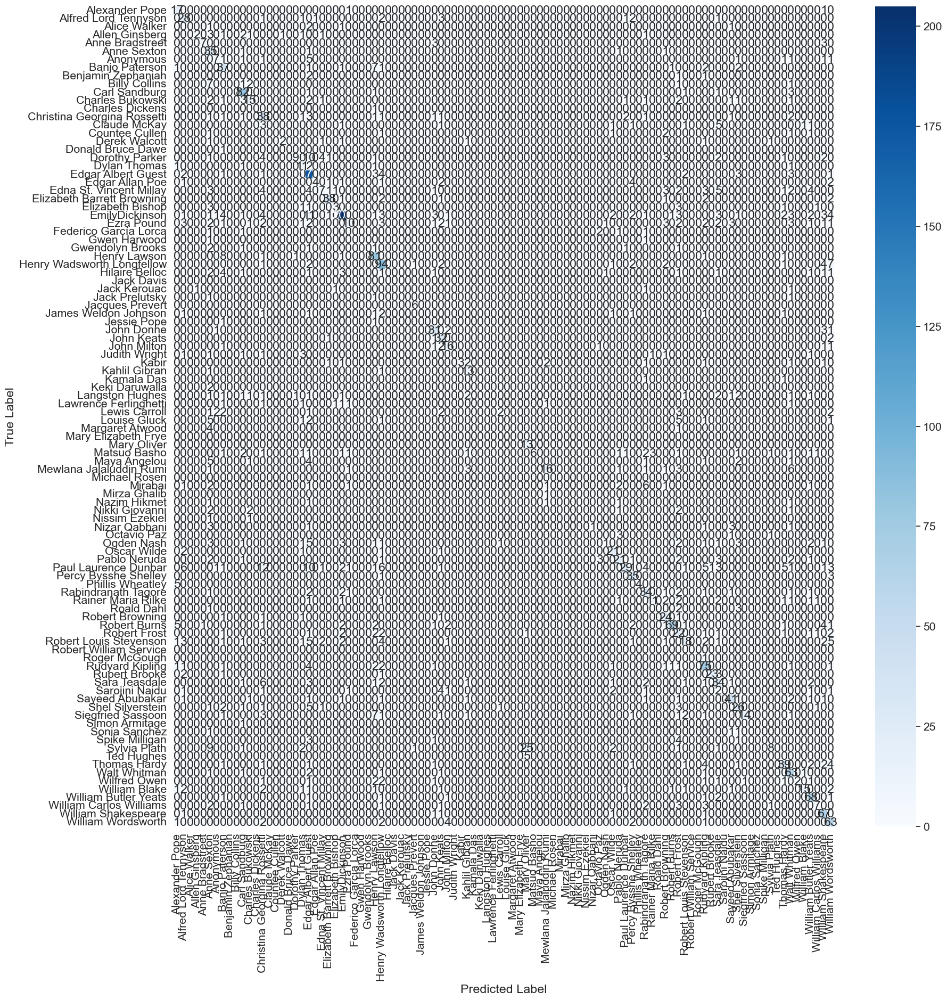

In [13]:

# Get the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=nb.classes_)

# Plot the confusion matrix
plt.figure(figsize=(20,20))
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=nb.classes_, yticklabels=nb.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [22]:
# create a Decision Tree classifier object
clf = DecisionTreeClassifier()

# fit the classifier to the training data
clf.fit(X_train, y_train)

# make predictions on the testing data
y_pred = clf.predict(X_test)



NameError: name 'accuracy_score' is not defined

In [24]:
# calculate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.29908076165462905


In [28]:
# export the Decision Tree as a dot file
dot_data = export_graphviz(clf, out_file=None, class_names=nb.classes_, filled=True, rounded=True, special_characters=True)

# create a graph from the dot file using pydotplus
graph = pydotplus.graph_from_dot_data(dot_data)

# save the graph as a PDF file
graph.write_pdf("Poets_Tree.pdf")

# display the graph
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.125758 to fit



In [29]:
scrapedTSDF

,10,100,11,12,13,14,15,16,17,18,...,yourself,yourselves,youth,youthful,youths,youâ,ys,zeal,zone,¾à
0,0,0,0,0,0,0,0,0,0,0,...,2,0,2,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15224,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
15225,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15226,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15227,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [10]:
Poems_CV=pd.DataFrame()
#Conut Vectorizer for APi Data
PoemsCountVectorizer=CountVectorizer(input = "filename", encoding="iso-8859-1", max_features= 5000)
Poems_CV = PoemsCountVectorizer.fit_transform(FullNameList)

In [11]:
PoemsColNames=PoemsCountVectorizer.get_feature_names_out()
Poems_CV=pd.DataFrame(Poems_CV.toarray(), columns=PoemsColNames)
print(Poems_CV.head())

   10  11  12  20  30  40  50  60  _elsie  _prince  ...  youngster  your  \
0   0   0   0   0   0   0   0   0       0        0  ...          0    28   
1   0   0   0   0   0   0   0   0       0        0  ...          0     1   
2   0   0   0   0   0   0   0   0       0        0  ...          0     0   
3   0   0   0   0   0   0   0   0       0        0  ...          0     0   
4   0   0   0   0   0   0   0   0       0        0  ...          0     0   

   yours  yourself  yourselves  youth  youthful  youâ  zeal  ¾à  
0      0         2           0      2         0     0     0   0  
1      0         0           0      1         0     0     1   0  
2      0         0           0      0         0     0     0   0  
3      0         0           0      0         0     0     0   0  
4      0         0           0      0         0     0     0   0  

[5 rows x 5000 columns]


In [12]:
import re

# Function to check if a string contains non-English characters or numbers
def contains_non_english(s):
    return bool(re.search('[^a-zA-Z\s]+', s))

# Function to drop columns where the column name itself contains non-English characters or numbers
def drop_non_english_cols(df):
    non_english_cols = []
    for col in df.columns:
        if contains_non_english(col) or any(char.isdigit() for char in col):
            non_english_cols.append(col)
    df = df.drop(columns=non_english_cols)
    return df



In [13]:
Poems_CV=drop_non_english_cols(Poems_CV)

In [22]:
X_train, X_test, y_train, y_test = train_test_split(new_df, LableList, test_size=0.2, random_state=42)


Begin
Training Polynomial kernel SVM models...


 25%|████████████████████▊                                                              | 1/4 [04:29<13:29, 269.74s/it]

C=0.1, mean score=0.246, std=0.005


 50%|█████████████████████████████████████████▌                                         | 2/4 [08:44<08:41, 261.00s/it]

C=1.0, mean score=0.303, std=0.014


 75%|██████████████████████████████████████████████████████████████▎                    | 3/4 [12:31<04:05, 245.43s/it]

C=10.0, mean score=0.407, std=0.009


100%|███████████████████████████████████████████████████████████████████████████████████| 4/4 [15:49<00:00, 237.49s/it]

C=100.0, mean score=0.488, std=0.011


Polynomial kernel accuracy: 0.489


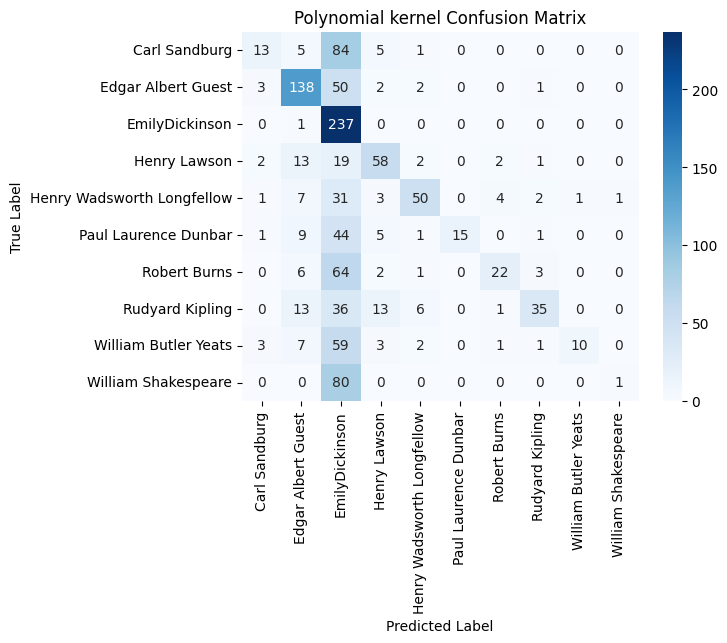

Training Radial Basis Function kernel SVM models...


 25%|████████████████████▊                                                              | 1/4 [04:28<13:25, 268.63s/it]

C=0.1, mean score=0.400, std=0.005


 50%|█████████████████████████████████████████▌                                         | 2/4 [08:03<07:53, 236.93s/it]

C=1.0, mean score=0.604, std=0.012


 75%|██████████████████████████████████████████████████████████████▎                    | 3/4 [10:50<03:24, 204.89s/it]

C=10.0, mean score=0.756, std=0.013


100%|███████████████████████████████████████████████████████████████████████████████████| 4/4 [13:26<00:00, 201.53s/it]

C=100.0, mean score=0.783, std=0.009


Radial Basis Function kernel accuracy: 0.617


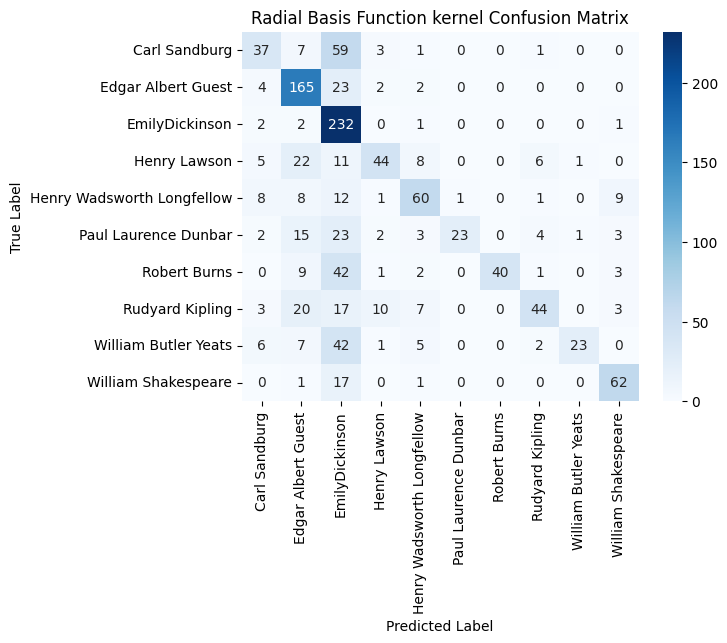

In [24]:
import time
from tqdm import tqdm
from sklearn.model_selection import cross_val_score
print("Begin")
# Define the SVM models with different kernels and costs
svm_models = {
    #'Linear': SVC(kernel='linear'),
    'Polynomial': SVC(kernel='poly'),
    'Radial Basis Function': SVC(kernel='rbf')
}

# Define the range of C values to try
c_values = [0.1, 1, 10, 100]

# Loop over the SVM models and C values
for kernel, svm_model in svm_models.items():
    print(f"Training {kernel} kernel SVM models...")
    for c in tqdm(c_values):
        # Set the C value of the SVM model
        svm_model.C = c

        # Compute the cross-validation scores
        scores = cross_val_score(svm_model, X_train, y_train, cv=5)

        # Compute the mean and standard deviation of the scores
        mean_score = scores.mean()
        std_score = scores.std()

        print(f"C={c:.1f}, mean score={mean_score:.3f}, std={std_score:.3f}")

    # Train the SVM model with the best hyperparameters
    best_c = c_values[np.argmax(scores)]
    svm_model.C = best_c
    svm_model.fit(X_train, y_train)

    # Test the SVM model
    y_pred = svm_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{kernel} kernel accuracy: {accuracy:.3f}")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=svm_model.classes_, yticklabels=svm_model.classes_)
    plt.title(f"{kernel} kernel Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

In [17]:
Poems_CV["LABLES"]=LablesList

In [9]:
Poems_CV.to_csv('Poems_CV.csv')

In [18]:
# count the number of occurrences of each label
label_counts = Poems_CV['LABLES'].value_counts()

# get the top 10 most frequent labels
top_10_labels = label_counts[:10].index.tolist()

# create a new dataset that contains only the top 10 most frequent labels
new_df = Poems_CV[Poems_CV['LABLES'].isin(top_10_labels)]

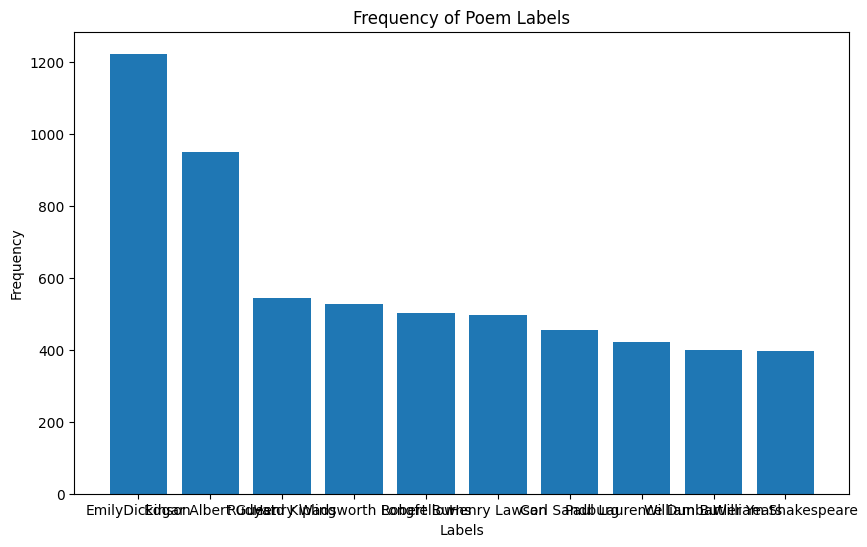

In [19]:
# count the frequency of each label
label_counts = new_df['LABLES'].value_counts()

# create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(label_counts.index, label_counts.values)
plt.title('Frequency of Poem Labels')
plt.xlabel('Labels')
plt.ylabel('Frequency')
plt.show()

In [20]:

LableList=new_df['LABLES']
new_df.drop('LABLES', inplace=True, axis=1)

C:\Users\LEGION\AppData\Local\Temp\ipykernel_7992\3453997252.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df.drop('LABLES', inplace=True, axis=1)


In [21]:
LableList

1067           Carl Sandburg
1068           Carl Sandburg
1069           Carl Sandburg
1070           Carl Sandburg
1071           Carl Sandburg
                ...         
14840    William Shakespeare
14841    William Shakespeare
14842    William Shakespeare
14843    William Shakespeare
14844    William Shakespeare
Name: LABLES, Length: 5919, dtype: object

Begin
Training Linear kernel SVM models...


 25%|████████████████████▊                                                              | 1/4 [02:18<06:56, 138.88s/it]

C=0.1, mean score=0.786, std=0.009


 50%|█████████████████████████████████████████▌                                         | 2/4 [04:18<04:15, 127.63s/it]

C=1.0, mean score=0.783, std=0.011


 75%|██████████████████████████████████████████████████████████████▎                    | 3/4 [06:18<02:04, 124.24s/it]

C=10.0, mean score=0.783, std=0.011


100%|███████████████████████████████████████████████████████████████████████████████████| 4/4 [08:18<00:00, 124.52s/it]

C=100.0, mean score=0.783, std=0.011


Linear kernel accuracy: 0.814


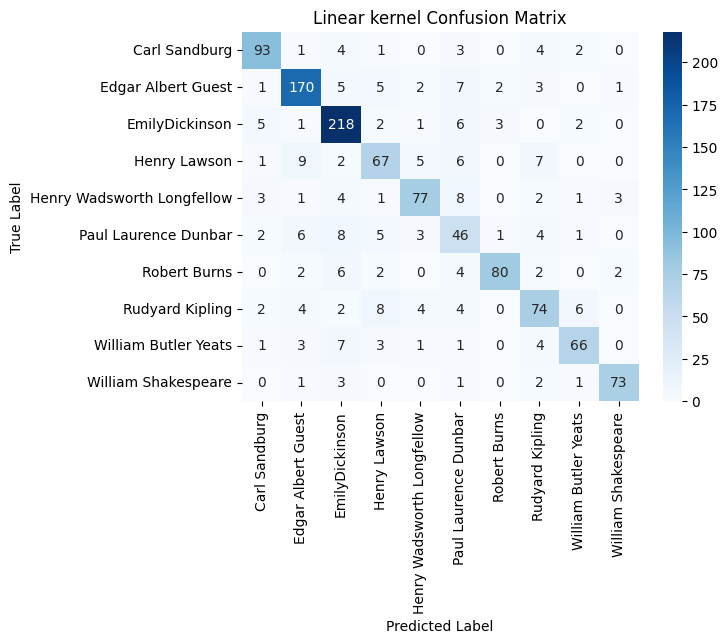

In [25]:
print("Begin")
# Define the SVM models with different kernels and costs
svm_models = {
    'Linear': SVC(kernel='linear'),
    #'Polynomial': SVC(kernel='poly'),
    #'Radial Basis Function': SVC(kernel='rbf')
}

# Define the range of C values to try
c_values = [0.1, 1, 10, 100]

# Loop over the SVM models and C values
for kernel, svm_model in svm_models.items():
    print(f"Training {kernel} kernel SVM models...")
    for c in tqdm(c_values):
        # Set the C value of the SVM model
        svm_model.C = c

        # Compute the cross-validation scores
        scores = cross_val_score(svm_model, X_train, y_train, cv=5)

        # Compute the mean and standard deviation of the scores
        mean_score = scores.mean()
        std_score = scores.std()

        print(f"C={c:.1f}, mean score={mean_score:.3f}, std={std_score:.3f}")

    # Train the SVM model with the best hyperparameters
    best_c = c_values[np.argmax(scores)]
    svm_model.C = best_c
    svm_model.fit(X_train, y_train)

    # Test the SVM model
    y_pred = svm_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{kernel} kernel accuracy: {accuracy:.3f}")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=svm_model.classes_, yticklabels=svm_model.classes_)
    plt.title(f"{kernel} kernel Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

In [26]:
# Split data into features (bag of words) and target (poet name)
X = new_df.values
y = LableList.values


In [28]:
# Standardize the features using StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [29]:
# Perform PCA to reduce the dimensionality of the data
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

In [31]:
# Visualize the decision boundary and data points
x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))
Z = svm_model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, alpha=0.4)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, s=20, edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('SVM decision boundary')
plt.show()

MemoryError: Unable to allocate 441. MiB for an array with shape (7834, 7382) and data type float64

# 